## 📜 Welcome Back, Visioneer
Having successfully passed through **Gate 1: The Chamber of Singular Truths**, you have proven your mastery of decomposition and reconstruction. The Grand Archivist nods approvingly:

"Well done, apprentice. You have learned to see the essential from the chaotic. Now you face Gate 2, where you must combine purification, detection, and recognition to unlock ancient secrets."

But the Archivist's warning echoes still:
"Beware. Those who attempt to pass with borrowed visions or false answers are cursed. Only true effort and understanding unlock the path forward."

## 🌀 Gate 2: Mosaic of Whispers
Theme: Image Denoising, Harris Corner Detection, Feature Matching

In the Gallery of Fragmented Memories, you find a beautiful Byzantine mosaic showing portraits of an ancient philosopher. As you admire it, Professor Dhoom Ketu steps out from the shadows, his wild hair floating and eyes full of mischief.

“Ah! The Mosaic of the Hidden Philosopher!” he says with a grin, handing you the preserved portrait. “This is your reference key.”

Suddenly, the Curse of Temporal Decay strikes—the rest of the mosaic is corrupted with noise and distortions. Professor Ketu sighs, “The curse again! Luckily, I saved the original before it was damaged. Now you can use this for your assignment.”

Run the following code to set things up:



# Assignment setup

In [ ]:
## Importing recipes
%matplotlib inline

import imageio
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import drive
from skimage.color import rgb2gray
# Mounting google drive
drive.mount('/content/drive')


import matplotlib.pyplot as plt

def display_images_in_row(images, labels=None, cmap=None):
    """
    Display multiple images in a single row with labels below them.

    Args:
        images (list): List of images (numpy arrays or tensors convertible to numpy).
        labels (list, optional): List of labels corresponding to each image.
        cmap (str, optional): Colormap for displaying grayscale images.
    """
    num_images = len(images)
    print(f"Displaying {num_images} image{'s' if num_images > 1 else ''}")

    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    # Ensure axs is iterable
    if num_images == 1:
        axs = [axs]

    for i, (ax, img) in enumerate(zip(axs, images)):
        # Choose colormap
        if cmap is None:
            if img.ndim == 2 or (img.ndim == 3 and img.shape[2] == 1):
                ax.imshow(img.squeeze(), cmap="gray")
            else:
                ax.imshow(img)
        else:
            ax.imshow(img, cmap=cmap)

        ax.axis("off")

        # Add label below image if available
        if labels is not None and i < len(labels):
            ax.set_title(labels[i], fontsize=12, fontweight="bold", pad=10)

    plt.tight_layout()
    plt.show()


# Resize the original image to a smaller size
def resize_image(img, max_size=200):
    """Resize image while maintaining aspect ratio"""
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        return resized
    return img


## Making recipes
base_path = "/content/drive/My Drive/ES666CV/images/B/"
mosaic_path = os.path.join(base_path, "mosaic.jpg")
key_path = os.path.join(base_path, "key.jpg")

# Load images
mosaic = cv2.imread(mosaic_path)        # BGR format
key = cv2.imread(key_path)

# Convert to RGB for matplotlib display
mosaic_rgb = cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB)
key_rgb = cv2.cvtColor(key, cv2.COLOR_BGR2RGB)

# Also convert to grayscale (float [0,1]) if needed for processing
mosaic_gray = rgb2gray(mosaic_rgb)
key_gray = rgb2gray(key_rgb)
mosaic_rgb_rs = resize_image(mosaic_rgb, max_size=500)
mosaic_rgb_rs = mosaic_rgb_rs.astype(np.float32) / 255.0

Mounted at /content/drive


# Mosaic and Key

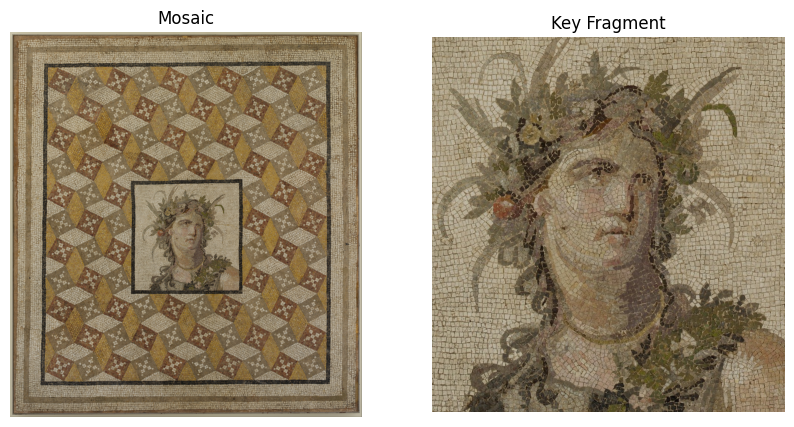

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(mosaic_rgb)
axs[0].set_title("Mosaic")
axs[0].axis("off")
axs[1].imshow(key_rgb)
axs[1].set_title("Key Fragment")
axs[1].axis("off")
plt.show()

### Task 1: Master the Arts of Purification (4 Marks)
Professor Ketu: "First, we must counteract the curse using the four sacred filtering techniques."

Implement the four denoising methods (mean, median, bilateral and gaussian) and compare their effectiveness:

In [ ]:
# run this cell as it is

def add_gaussian_noise(img, mean=0, var=0.01):
    if img.dtype != np.float32:
        img = img.astype(np.float32) / 255.0

    sigma = var**0.5
    noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)
    noisy_img = np.clip(img + noise, 0.0, 1.0)

    return noisy_img


def add_salt_pepper_noise(img, amount=0.05):

    noisy_img = img.copy()
    H, W, _ = noisy_img.shape

    num_noisy_pixels = int(amount * H * W)

    row_coords = np.random.randint(0, H, num_noisy_pixels)
    col_coords = np.random.randint(0, W, num_noisy_pixels)

    num_salt = num_noisy_pixels // 2

    noisy_img[row_coords[:num_salt], col_coords[:num_salt], :] = 1.0

    noisy_img[row_coords[num_salt:], col_coords[num_salt:], :] = 0.0

    return noisy_img

def generate_noisy_versions_rgb(img, gaussian_vars, sp_amounts):

    noisy_versions = {
        "gaussian": np.array([add_gaussian_noise(img, var=v) for v in gaussian_vars]),
        "salt_pepper": np.array([add_salt_pepper_noise(img, amount=a) for a in sp_amounts])
    }
    return noisy_versions

gaussian_vars = [0.001, 0.01, 0.05]       # variance levels
sp_amounts = [0.01, 0.05, 0.1]           # salt & pepper intensity

noisy_mosaic = generate_noisy_versions_rgb(mosaic_rgb_rs, gaussian_vars, sp_amounts)



Gaussian Noise with different variance
Displaying 3 images


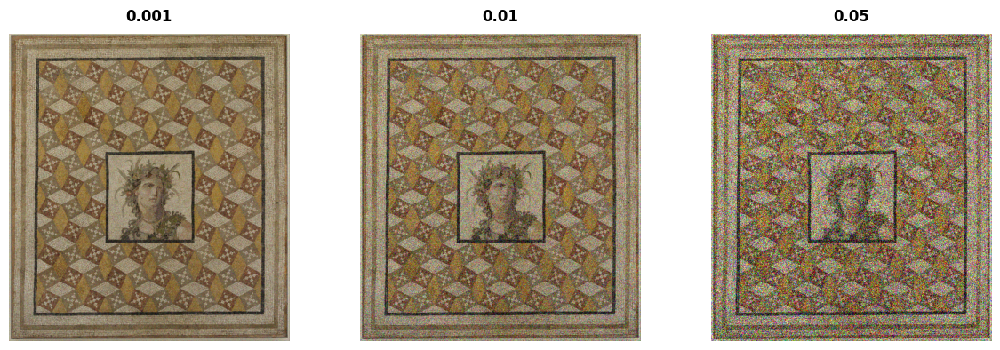

Salt and pepper Noise with different intensities
Displaying 3 images


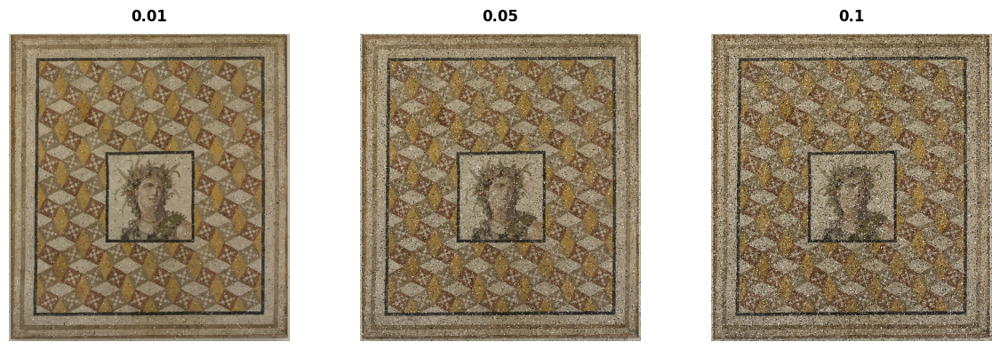

In [ ]:
print("Gaussian Noise with different variance")
display_images_in_row(noisy_mosaic["gaussian"],labels=["0.001","0.01","0.05"])
print("Salt and pepper Noise with different intensities")
display_images_in_row(noisy_mosaic["salt_pepper"], labels=["0.01","0.05","0.1"])



### Implement filters here for all the noise levels

In [ ]:
import numpy as np

def mean_filter(img, kernel_size=3):
    # filtered = img
    # Write your code here

    ## 1. I will create 3X3 matrix with each value 1 and then divided by 3*3=9.
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size * kernel_size)

    ## 2. convolving img with the kernel by using filter2D func.
    filtered = cv2.filter2D(img, -1, kernel)  # ddepth=-1= same datatype

    return filtered

def median_filter(img, kernel_size=3):
    filtered = img.copy()
    # Write your code here
    pad_size = kernel_size//2
    for rgb in range(0, img.shape[2]):
      ## 1. For the median filter 1st I will pad the img with edge values using numpy so that filter can update all center values i.e. all pixels
      padded_img = np.pad(filtered[:,:,rgb], pad_size, mode="edge")

      ## 2. Now we will take filter_size neibourhood matrix and convert into 1D and sort them and update center value to median of sorted 1D array
      for j in range(0, img.shape[1]):
        for i in range(0, img.shape[0]):
          window = padded_img[i: i+kernel_size, j: j+kernel_size]
          median_val = np.median(window)  # flattens 2d array and gives median
          filtered[i,j, rgb]=median_val

    return filtered

def gaussian_filter(img, kernel_size=5, sigma=1.0):
    filtered = img
    # Write your code here
    kernel = np.zeros((kernel_size, kernel_size), dtype=float)

    ## 1. Making kernel from gaussing function
    for i in range(kernel_size):
      for j in range(kernel_size):
        x=i-(kernel_size//2)
        y=j-(kernel_size//2)
        kernel[i,j] = np.exp(-(x**2+y**2)/(2*sigma**2))/(2*np.pi*sigma**2)

    ## 2. Normalise the kernel by dividing it's total sum
    s = np.sum(kernel)
    kernel = kernel/s

    ## 3. Applying filter to img by convoluting
    filtered = cv2.filter2D(img, -1, kernel)

    return filtered

def bilateral_filter(img, diameter=5, sigma_color=0.2, sigma_space=2.0):
    # filtered = cv2.bilateralFilter(img, diameter, sigma_color, sigma_space)
    filtered = img.copy()
    # Write your code here
    radius = diameter//2

    ## 1. First we will compute the weightes according distance(spatial) i.e. closer pixels matter more so apply guasian kernel weights in space
    spatial_kernel = np.zeros((diameter, diameter), dtype=float)
    for i in range(diameter):
      for j in range(diameter):
        x=i-radius
        y=j-radius
        spatial_kernel[i,j] = np.exp(-(x**2+y**2)/(2*sigma_space**2))

    ## 2. Now edges and corners vary pixels more i.e we will penelise the pixels more is differece of intesities is more so applying guassian in intensity difference
    for rgb in range(0, img.shape[2]):
      ### padding the image like I did in median filter
      padded_img = np.pad(filtered[:,:,rgb], radius, mode="edge")

      for j in range(0, img.shape[1]):
        for i in range(0, img.shape[0]):

          ### a. Extracting neighborhood kernel
          window = padded_img[i: i+diameter, j: j+diameter]
          ### b. Range kernel which depends on the intensity difference
          diff = window - img[i,j,rgb]
          ### c. difining the range kernel based on guassian of the diff matrix
          range_kernel = np.exp(-(diff)**2/(2*sigma_color**2))

          ## 3. Now we are building the total kernel based on the spatial and range
          bilateral_kernel = spatial_kernel * range_kernel
          s = np.sum(bilateral_kernel)
          bilateral_kernel = bilateral_kernel/s

          ## 4. Applying bilateral filter to the img
          filtered[i,j,rgb] = np.sum(bilateral_kernel * window)


    return filtered


Row 1: gaussian noise (level=0.001)
Displaying 5 images


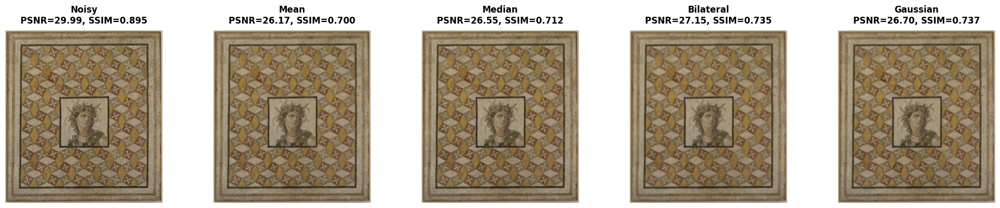

Row 2: gaussian noise (level=0.01)
Displaying 5 images


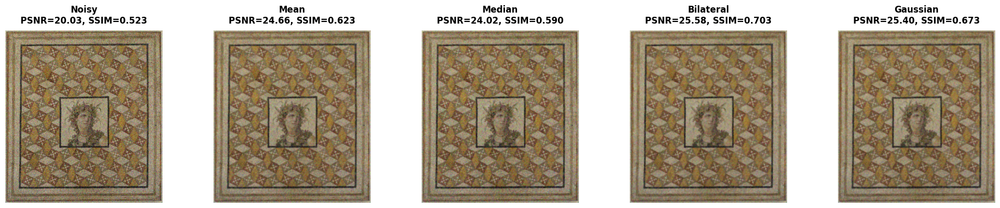

Row 3: gaussian noise (level=0.05)
Displaying 5 images


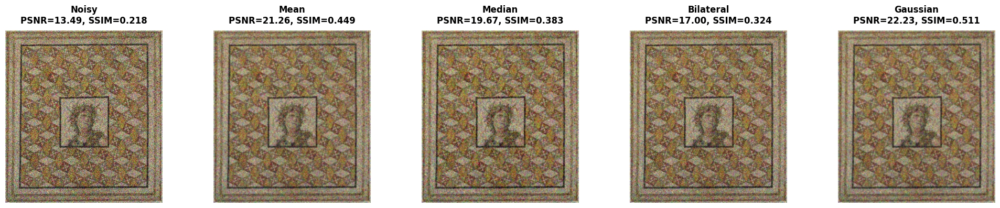

Row 4: salt_pepper noise (level=0.01)
Displaying 5 images


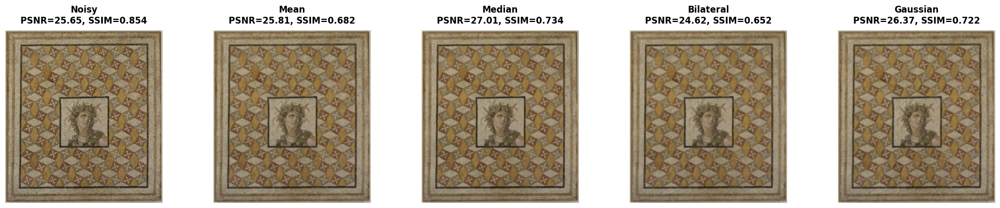

Row 5: salt_pepper noise (level=0.05)
Displaying 5 images


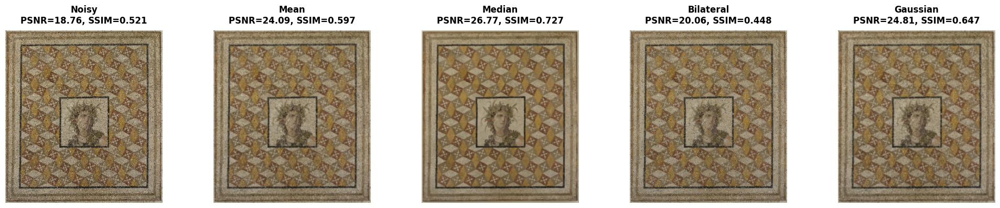

Row 6: salt_pepper noise (level=0.1)
Displaying 5 images


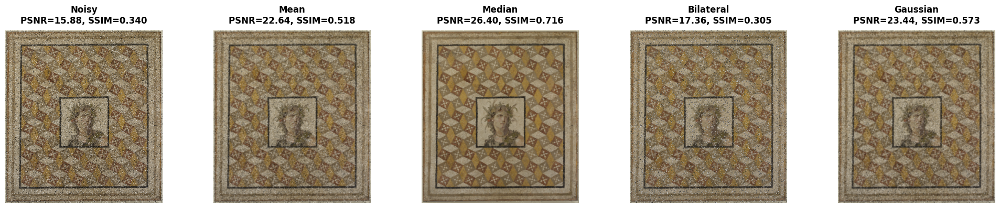

In [ ]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def test_filters_minimal( noisy_versions, filter_functions, filter_names):
    rows = []
    row_info = []  # keep track of (noise_type, param)

    noise_params = [
        ('gaussian', [0.001, 0.01, 0.05]),
        ('salt_pepper', [0.01, 0.05, 0.1])
    ]

    for noise_type, params in noise_params:
        for i, param in enumerate(params):
            noisy = noisy_versions[noise_type][i]
            denoised_imgs = [f(noisy) for f in filter_functions]
            row_imgs = [noisy] + denoised_imgs

            rows.append(row_imgs)
            row_info.append((noise_type, param))

    # Display all rows
    for i, (row_imgs, (noise_type, param)) in enumerate(zip(rows, row_info)):
        print(f"Row {i+1}: {noise_type} noise (level={param})")

        # Computing PSNR/SSIM for each image relative to clean reference
        labels = ["Noisy"] + filter_names
        labels_with_metrics = []
        for label, img in zip(labels, row_imgs):
            psnr_val = psnr(mosaic_rgb_rs, img, data_range=1.0)
            ssim_val = ssim(mosaic_rgb_rs, img, channel_axis=-1, data_range=1.0)
            labels_with_metrics.append(f"{label}\nPSNR={psnr_val:.2f}, SSIM={ssim_val:.3f}")

        display_images_in_row(row_imgs, labels_with_metrics)

    return None

filter_functions = [mean_filter, median_filter, bilateral_filter, gaussian_filter]
filter_names = ['Mean', 'Median', 'Bilateral', 'Gaussian']


test_filters_minimal(noisy_mosaic, filter_functions, filter_names)

# you should find psnr or ssim as well to get a better understanding

📖 Theory Q: Question: Which filtering method works best for gaussian noise and which works for salt and pepper noise? Why?   
Ans:
- For Gaussian noise of level 0.001 and 0.01 bilateral kernel works best and for level 0.05 gaussian kernel works best.
   - Gaussian noise spread continuouly thoughout the image. Linear smoothing filters such as bilateral and guassian works good on gaussian noise because these kernels reduce the noise by averaging nearby pixels' intensities.
   - When we apply averaging then the variance of noise also reduces. Suppose we average n pixels then new variance of noise will be old_variance / n
   - Bilateral filter also averages, but it gives a pixel a large weight only if that neighbor is close in space, and close in intensity (i.e. near pixel and similar brightness pixels). So pixels across an edge get almost zero weight and don't get mixed together and edges stay sharp.
- For salt and pepper noise of all levels median filter works best.
   - Salt-and-pepper noise is impulse noise where some pixels are randomly set to very dark (0) or very bright (255) values.
   - In median kernel single black or white pixel in a 3X3 window will be replaced by a normal neighboring value i.e. impulse disappears without smoothing edges.

### Task 2: Detect the Points of Truth (3 Marks)
Professor Ketu: "Seek geometric truth in the original, not the corrupted version! The curse creates false corners."

Implement Harris Corner Detection on the pristine original image:

(13810, 2)
(182410, 2)
Displaying 2 images


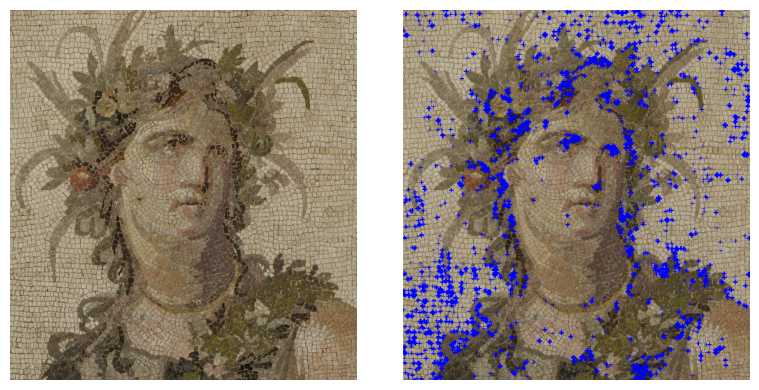

Displaying 2 images


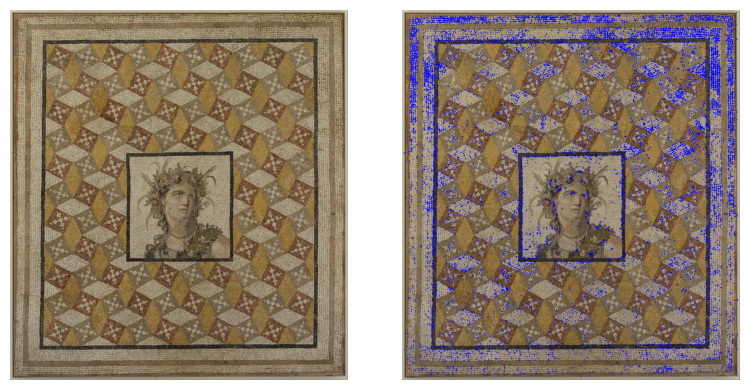

In [ ]:
def detect_harris_corner(image):

    corner_image = None
    # Write your code here

    ## 1. Converting rgb image to the gray scale
    image_gray = rgb2gray(image)

    ## 2. First gaussian smoothing
    image_s = gaussian_filter(image_gray, kernel_size=5, sigma=1.0)

    ## 3. Applying sobel derivative
    image_x = cv2.Sobel(image_s, cv2.CV_64F, 1, 0, ksize=3)
    image_y = cv2.Sobel(image_s, cv2.CV_64F, 0, 1, ksize=3)
    image_xx = image_x**2
    image_yy = image_y**2
    image_xy = image_x*image_y

    ## 4. Convolving above images with box filter or guassian filter
    image_xx = mean_filter(image_xx, kernel_size=5)
    image_yy = mean_filter(image_yy, kernel_size=5)
    image_xy = mean_filter(image_xy, kernel_size=5)

    ## 5. Forming the magnitude matrix of image
    M = ([image_xx, image_xy], [image_xy, image_yy])

    ## 6. Computing the Response matrix
    det_M = image_xx*image_yy - image_xy**2
    trace_M = image_xx + image_yy
    R = det_M - 0.04* (trace_M ** 2)

    ## 7. Thresholding the R
    threshold = 0.05 * R.max()

    ## 8. Finding the corners
    corners = np.argwhere(R > threshold)
    corner_image = image.copy()
    for corner in corners:
      cv2.drawMarker(corner_image, (corner[1], corner[0]), (0,0,255), markerType=cv2.MARKER_CROSS, markerSize=10, thickness=1)

    if corner_image is None:
        return image

    print (corners.shape)
    return corner_image ,corners

key_harris , key_corners = detect_harris_corner(key_rgb)
mosaic_harris , mosaic_corners = detect_harris_corner(mosaic_rgb)
display_images_in_row([key_rgb,key_harris])
display_images_in_row([mosaic_rgb,mosaic_harris])

📖 Theory Q: What mathematical property of the Harris matrix allows it to distinguish between edges and corners?  
Ans.
- M = [ [Ix^2 , Ix.Iy], [Ix.Iy, Iy^2] ] this  is magnitude matrix  which explains how image intensity changes around that point
- The imp mathematical propery is the eigenvalues of M i.e. lambda1 and lambda2
   1. Corner (Strong change in both directions) means lambda_1>>0 and lambda_2 >>0
   2. Edge (strong change in one direction only) means lambda_1>>0 and lambda_2 ~0
   3. Flat region (small change in both direction) lambda_1~0 and lambda_2 ~0

- Harris doesn't compute eigen values directly. I computes R ,
    - R = det(M) - k. (trace(M))^2
    - det(M) = lambda_1 . lambda_2
    - trace(M) = lambda_1 + lambda_2
    - At corners R is positive and large
    - At edges R becomes negative
    - Ar flat region R is approx 0
  

### Task 3: Find the Hidden Philosopher (3 Marks)
Professor Ketu: "Combine my teachings! Let the original guide your search, let clarity reveal the details."

Implement feature matching to find the philoshopher in the mosaic, you can use SSD (Sum of squared differences):

Hint:How can you describe small patches around keypoints in both images?  
 How do you measure similarity between descriptors?

In [ ]:
def extract_descriptors(img, corners, patch_size=15):

    descriptors, valid_points = [], []
    # Write your code here

    ## 1. Converting rgb image to the gray scale
    img_gray = rgb2gray(img)
    img_gray = np.float32(img_gray)
    half_patch = patch_size//2
    h, w = img_gray.shape

    for (y, x) in corners:
      # Skipping points near border becuase we can not access patch (due to earlier i got error)
      if (y - half_patch >= 0 and y + half_patch < h and x - half_patch >= 0 and x + half_patch < w):

        ## 2. extracting the the patch
        patch = img_gray[y-half_patch:y+half_patch+1, x-half_patch:x+half_patch+1]

        ## 3. Flatten i.e. Converts the patch_size × patch_size patch into a 1D vector
        desc = patch.flatten()

        ## 4. Normalise
        desc = (desc - np.mean(desc)) / (np.std(desc) + 1e-8)

        descriptors.append(desc)
        valid_points.append([y, x])

    return np.array(valid_points), np.array(descriptors)

def match_features(desc1, desc2, pts1, pts2, ratio=0.7):
    matches = []
    # Write your code here
    ## desc1 is actual key image and desc2 is whole mosiac we need to check matching between those 2 images so I am going to match desc1 to desc2

    for i, d1 in enumerate(desc1):
      ## 1. computing the SSD between one descriptor and all others
      ssd = np.sum((d1 - desc2)**2, axis=1)

      ## 2. Sorting by distance
      sorted_idx = np.argsort(ssd)
      best, second_best = sorted_idx[0], sorted_idx[1]

      if ssd[best] < ratio * ssd[second_best]:
          matches.append((tuple(pts1[i]), tuple(pts2[best])))

    return matches

pts_mosaic, desc_mosaic = extract_descriptors(mosaic_rgb, mosaic_corners)
pts_key, desc_key = extract_descriptors(key_rgb, key_corners)

[((np.int64(7), np.int64(600)), (np.int64(1528), np.int64(1888))), ((np.int64(7), np.int64(601)), (np.int64(1528), np.int64(1889))), ((np.int64(7), np.int64(602)), (np.int64(1528), np.int64(1890))), ((np.int64(8), np.int64(600)), (np.int64(1529), np.int64(1888))), ((np.int64(8), np.int64(601)), (np.int64(1529), np.int64(1889))), ((np.int64(8), np.int64(602)), (np.int64(1529), np.int64(1890))), ((np.int64(9), np.int64(208)), (np.int64(1530), np.int64(1496))), ((np.int64(9), np.int64(209)), (np.int64(1530), np.int64(1497))), ((np.int64(9), np.int64(210)), (np.int64(1530), np.int64(1498))), ((np.int64(9), np.int64(601)), (np.int64(1530), np.int64(1889))), ((np.int64(9), np.int64(602)), (np.int64(1530), np.int64(1890))), ((np.int64(9), np.int64(603)), (np.int64(1530), np.int64(1891))), ((np.int64(9), np.int64(604)), (np.int64(1530), np.int64(1892))), ((np.int64(10), np.int64(9)), (np.int64(1531), np.int64(1297))), ((np.int64(10), np.int64(208)), (np.int64(1531), np.int64(1496))), ((np.int6

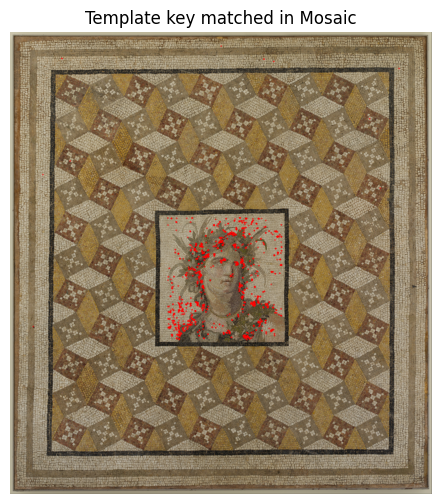

In [ ]:
matches = match_features(desc_key, desc_mosaic, pts_key, pts_mosaic)

print(matches)
mosaic_vis = mosaic_rgb.copy()
for (y1, x1), (y2, x2) in matches:
    cv2.circle(mosaic_vis, (x2, y2), 5, (255, 0, 0), 2)

plt.figure(figsize=(10, 6))
plt.imshow(mosaic_vis)
plt.title("Template key matched in Mosaic")
plt.axis("off")
plt.show()

📖 Theory Q: What are potential weaknesses of SSD-based matching compared to modern descriptors like SIFT/ORB?  
Ans.
- SSD is simple patch based descritptor. Around each keypoint we take a small patch of pixels, flatten it and compared it with other patches.
- SIFT is robust. It detects keypoints at many scales (scale invariant) and finds dominant orientation (rotation invariant). Each keypoint is described using a histogram of gradient orientations around it.
- ORB is fast binary descriptor. It uses detector to find keypoints and turns patches into binary codes( 0 and 1) so computer can compute it quickly. ORB adds orientation and rotation invariance.


Potential weaknesses of SSD:
1. SSD uses real pixel values if we change brightness or contranst then it will affect matching
2. SSD only works if patches are aligned in size and orientation
3. Flattened patches are large vectors so it takes time to match the features.
4. Repetitive texture like bricks or tile can produce ambiguous match
5. SSD requies computing euclidean distances for all patches comparisons so it will take lot of time. ORB is much faster.
6. SIFT looks at the direction of edges and gradients around a keypoint, so it can handle rotation, scaling, and lighting changes. ORB uses a binary code to describe keypoints, making it very fast for matching, while still being somewhat robust to rotation.
